# Bank Marketing Data Set - Term Deposit Sale

### The historical data for this project is available in file
#### https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

## Goal

#### Using the data collected from existing customers, build a model that will help the marketing team identify potential customers who are relatively more likely to subscribe term deposit and thus increase their hit ratio. 


## Attribute information

### Input variables:

#### Bank client data:
    1. age: Continuous feature
    2. job: Type of job (management, technician, entrepreneur, blue-collar, etc.)
    3. marital: marital status (married, single, divorced)
    4. education: education level (primary, secondary, tertiary)
    5. default: has credit in default?
    6. housing: has housing loan?
    7. loan: has personal loan?
    8. balance in account
#### Related to previous contact:
    9. contact: contact communication type
    10. month: last contact month of year
    11. day: last contact day of the month
    12. duration: last contact duration, in seconds*
#### Other attributes:
    13. campaign: number of contacts performed during this campaign and for this client
    14. pdays: number of days that passed by after the client was last contacted from a previous campaign (-1 tells us the person has not been contacted or contact period is beyond 900 days)
    15. previous: number of times the client has been contacted before for the last campaign to subscribe term deposit
    16. poutcome: outcome of the previous marketing campaign 
    
### Output variable (desired target):
    17. Target: Tell us has the client subscribed a term deposit. (Yes, No)

### Import the Libraries

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt 
import seaborn as sns
import pandas_profiling
#styling figures
plt.rc('font',size=14)
sns.set(style='white')
sns.set(style='whitegrid',color_codes=True)
#To enable plotting graphs in Jupyter notebook
%matplotlib inline

# Import Logistic Regression machine learning library
from sklearn.linear_model import LogisticRegression 

#Import machine learning Library
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix
from yellowbrick.classifier import ClassificationReport, ROCAUC

# splitting data into training and test set for independent attributes
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier

plt.style.use('ggplot')
pd.options.display.float_format = '{:,.2f}'.format
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

ModuleNotFoundError: No module named 'pandas_profiling'

## Deliverable – 1 (Exploratory data quality report reflecting the following) – (20)

#### Load the Data set

In [2]:
bank_data = pd.read_csv('bank-full.csv')

In [3]:
bank_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


##### It shows that there are sixteen independent variables ( age, job, marital, education, default, balance, housing, loan, contact, day, month, duration, compaign, pdays, previous, poutcome) and one dependent variable (Target).
##### There are many columns which are not numeric.

In [4]:
bank_data.tail()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no
45210,37,entrepreneur,married,secondary,no,2971,no,no,cellular,17,nov,361,2,188,11,other,no


### Exploratory data quality report

##### Univariate analysis
###### Data Types and description

In [5]:
bank_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [6]:
bank_data.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
Target       object
dtype: object

It gives the data types of each column of the dataset. Most of the columns such as job, marital, education, default, housing, loan, contact, month, poutcome, Target are categorical data types. Here, it is showing object data type. So, we have to convert these to categorical data type.

In [7]:
bank_data['Target']=bank_data.Target.astype('category')
bank_data['job']=bank_data.job.astype('category')
bank_data['marital']=bank_data.marital.astype('category')
bank_data['education']=bank_data.education.astype('category')
bank_data['default']=bank_data.default.astype('category')
bank_data['housing']=bank_data.housing.astype('category')
bank_data['loan']=bank_data.loan.astype('category')
bank_data['contact']=bank_data.contact.astype('category')
bank_data['month']=bank_data.month.astype('category')
bank_data['poutcome']=bank_data.poutcome.astype('category')
#bc_df['diagnosis'] = bc_df.diagnosis.astype('category')
bank_data.dtypes

age             int64
job          category
marital      category
education    category
default      category
balance         int64
housing      category
loan         category
contact      category
day             int64
month        category
duration        int64
campaign        int64
pdays           int64
previous        int64
poutcome     category
Target       category
dtype: object

In [8]:
bank_data.shape

(45211, 17)

In [9]:
bank_data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'Target'],
      dtype='object')

In [10]:
bank_data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


age, balance are right skewed

### Description of independent attributes

### Age

In [11]:
print('Minimum age: ', bank_data['age'].min())
print('Maximum age: ',bank_data['age'].max())
print('Mean value: ', bank_data['age'].mean())
print('Median value: ',bank_data['age'].median())
print('Standard deviation: ', bank_data['age'].std())
print('Null values: ',bank_data['age'].isnull().any())

Minimum age:  18
Maximum age:  95
Mean value:  40.93621021432837
Median value:  39.0
Standard deviation:  10.618762040975431
Null values:  False


In [12]:
Q1=bank_data['age'].quantile(q=0.25)
Q3=bank_data['age'].quantile(q=0.75)
print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)

1st Quartile (Q1) is:  33.0
3st Quartile (Q3) is:  48.0


In [13]:
# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR
L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)
print('Lower outliers in Ages: ', L_outliers)
print('Upper outliers in Ages: ', U_outliers)

Lower outliers in Ages:  10.5
Upper outliers in Ages:  70.5


In [14]:
print('Number of outliers in Age upper : ', bank_data[bank_data['age']>70.5]['age'].count())
print('Number of outliers in Age lower : ', bank_data[bank_data['age']<10.5]['age'].count())
print('% of Outlier in Age upper: ',round(bank_data[bank_data['age']>70.5]['age'].count()*100/len(bank_data)), '%')
print('% of Outlier in Age lower: ',round(bank_data[bank_data['age']<10.5]['age'].count()*100/len(bank_data)), '%')

Number of outliers in Age upper :  487
Number of outliers in Age lower :  0
% of Outlier in Age upper:  1.0 %
% of Outlier in Age lower:  0.0 %


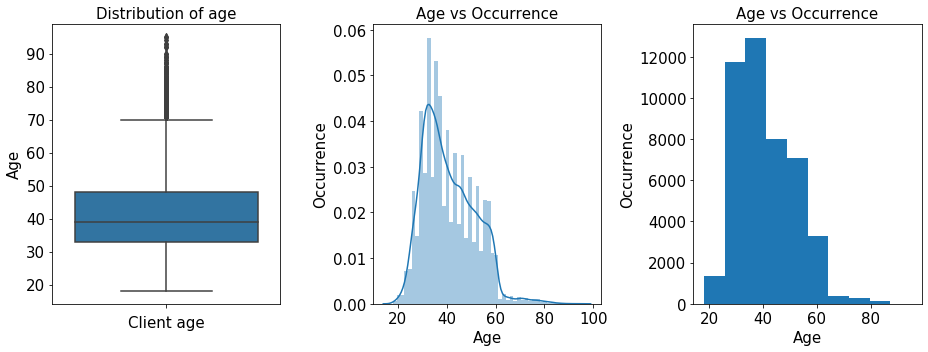

In [15]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='age',data=bank_data,orient='v',ax=ax1)
ax1.set_xlabel('Client age', fontsize=15)
ax1.set_ylabel('Age', fontsize=15)
ax1.set_title('Distribution of age', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(bank_data['age'],ax=ax2)
ax2.set_xlabel('Age', fontsize=15)
ax2.set_ylabel('Occurrence', fontsize=15)
ax2.set_title('Age vs Occurrence', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(bank_data['age'])
ax3.set_xlabel('Age', fontsize=15)
ax3.set_ylabel('Occurrence', fontsize=15)
ax3.set_title('Age vs Occurrence', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

#####  We have clients with all the ages (minimum age 18 to maximum age 95).
##### Mean and median have very less diference.
##### age attribute does not have any missing values.
##### age is right skewed. As more number of data points are present on right tail. The boxplot, distplot and histogram is also showing the same.

### JOB

In [16]:
print('Jobs: \n', bank_data['job'].unique())

Jobs: 
 [management, technician, entrepreneur, blue-collar, unknown, ..., services, self-employed, unemployed, housemaid, student]
Length: 12
Categories (12, object): [management, technician, entrepreneur, blue-collar, ..., self-employed, unemployed, housemaid, student]


In [17]:
bank_data.groupby('job').size()

job
admin.           5171
blue-collar      9732
entrepreneur     1487
housemaid        1240
management       9458
retired          2264
self-employed    1579
services         4154
student           938
technician       7597
unemployed       1303
unknown           288
dtype: int64

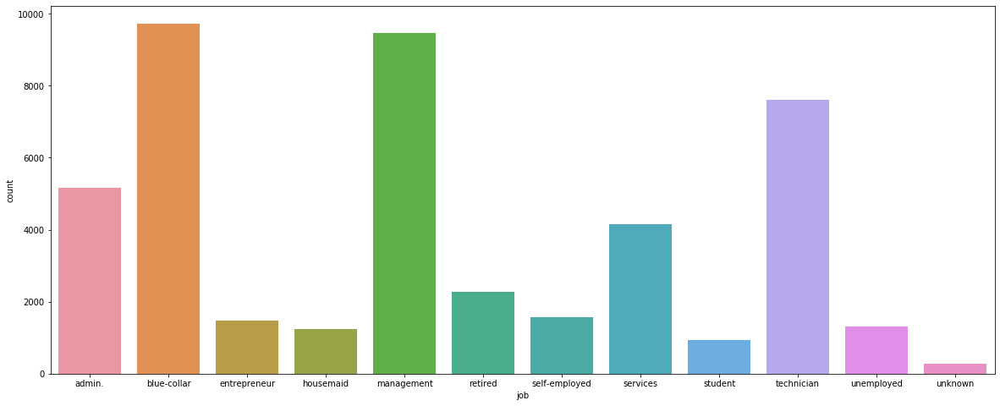

In [18]:
fig, ax=plt.subplots()
fig.set_size_inches(20,8)
#countplot
sns.countplot(bank_data['job'],data=bank_data)
ax1.set_xlabel('Job', fontsize=18)
ax1.set_ylabel('Count', fontsize=18)
ax1.set_title('Job vs Count', fontsize=18)
ax1.tick_params(labelsize=20)

In [19]:
bank_data['job'].unique()

[management, technician, entrepreneur, blue-collar, unknown, ..., services, self-employed, unemployed, housemaid, student]
Length: 12
Categories (12, object): [management, technician, entrepreneur, blue-collar, ..., self-employed, unemployed, housemaid, student]

In [20]:
#Optimize the number of classes in job
bank_data['job']=np.where(bank_data['job']=='blue-collar','worker',bank_data['job'])
bank_data['job']=np.where(bank_data['job']=='housemaid','worker',bank_data['job'])
bank_data['job']=np.where(bank_data['job']=='management','managerial',bank_data['job'])
bank_data['job']=np.where(bank_data['job']=='services','managerial',bank_data['job'])
bank_data['job']=np.where(bank_data['job']=='admin','managerial',bank_data['job'])
bank_data['job']=np.where(bank_data['job']=='enterpreneur','managerial',bank_data['job'])
bank_data['job'].unique()

array(['managerial', 'technician', 'entrepreneur', 'worker', 'unknown',
       'retired', 'admin.', 'self-employed', 'unemployed', 'student'],
      dtype=object)

##### Job attribute shows the clients job information.
##### It also shows that there are some unknown values. We do not know about the jobs of some clients. It indicates the missing values.
##### Countplot shows that blue-collar, management, and technician clients have more subscriptions than the other clients.

### Marital

In [21]:
print('Marital: \n', bank_data['marital'].unique())

Marital: 
 [married, single, divorced]
Categories (3, object): [married, single, divorced]


In [22]:
bank_data.groupby('marital').size()

marital
divorced     5207
married     27214
single      12790
dtype: int64

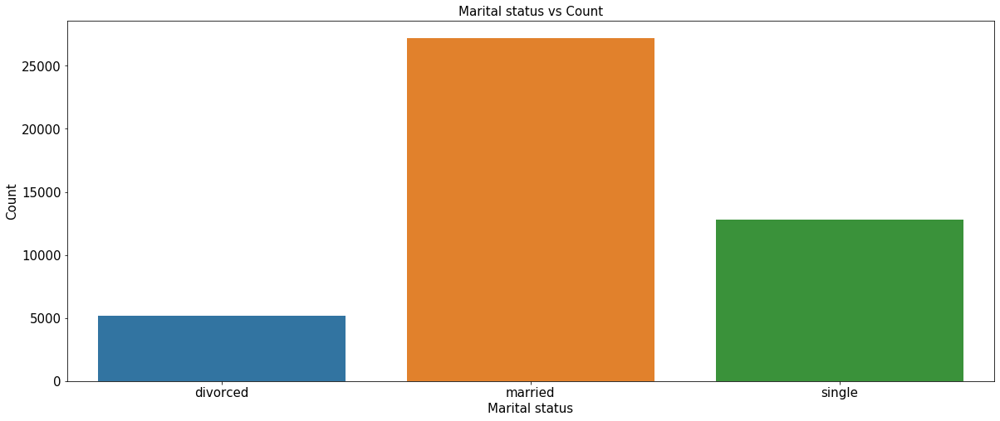

In [23]:
fig, ax=plt.subplots()
fig.set_size_inches(20,8)

#countplot
sns.countplot(bank_data['marital'],data=bank_data)
ax.set_xlabel('Marital status', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Marital status vs Count', fontsize=15)
ax.tick_params(labelsize=15)

### It shows that married people are taking more term deposits than the other people.

### Education

In [24]:
print('Education: \n', bank_data['education'].unique())

Education: 
 [tertiary, secondary, unknown, primary]
Categories (4, object): [tertiary, secondary, unknown, primary]


In [25]:
bank_data.groupby('education').size()

education
primary       6851
secondary    23202
tertiary     13301
unknown       1857
dtype: int64

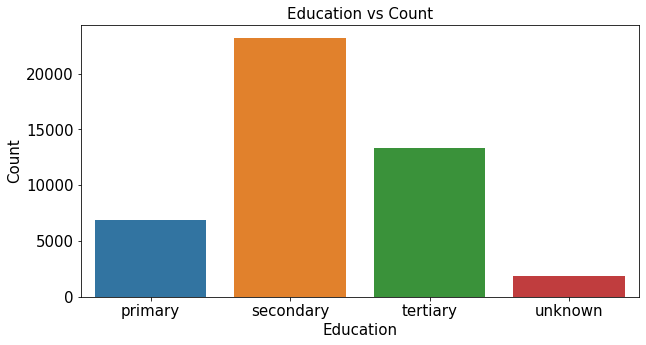

In [26]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(bank_data['education'],data=bank_data)
ax.set_xlabel('Education', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Education vs Count', fontsize=15)
ax.tick_params(labelsize=15)

### Default, Housing, Loan

Default: 
 [no, yes]
Categories (2, object): [no, yes]


Housing: 
 [yes, no]
Categories (2, object): [yes, no]


Loan: 
 [no, yes]
Categories (2, object): [no, yes]




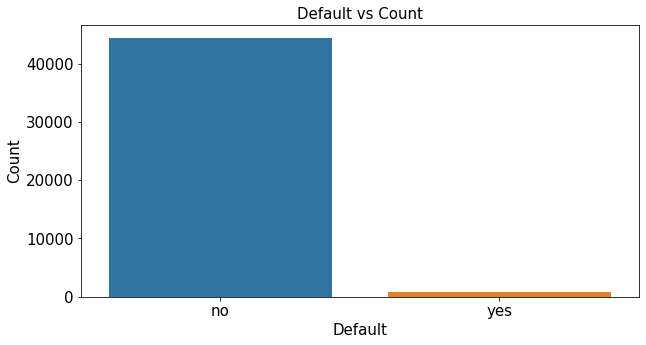

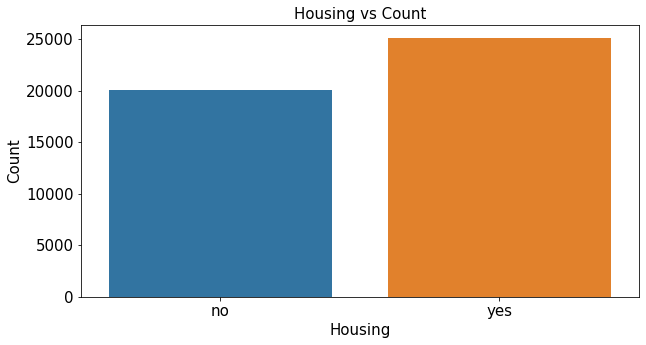

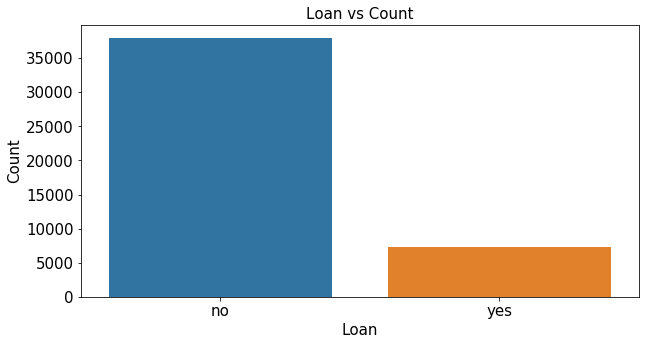

In [27]:
#### Default

print('Default: \n', bank_data['default'].unique())
print()
print()
bank_data.groupby('default').size()

fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(bank_data['default'],data=bank_data)
ax.set_xlabel('Default', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Default vs Count', fontsize=15)
ax.tick_params(labelsize=15)

#### Housing

print('Housing: \n', bank_data['housing'].unique())
print()
print()
bank_data.groupby('housing').size()

fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(bank_data['housing'],data=bank_data)
ax.set_xlabel('Housing', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Housing vs Count', fontsize=15)
ax.tick_params(labelsize=15)

#### Loan

print('Loan: \n', bank_data['loan'].unique())
print()
print()
bank_data.groupby('loan').size

fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(bank_data['loan'],data=bank_data)
ax.set_xlabel('Loan', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Loan vs Count', fontsize=15)
ax.tick_params(labelsize=15)

### Balance in Account

In [28]:
print('Minimum balance: ', bank_data['balance'].min())
print('Maximum balance: ',bank_data['balance'].max())
print('Mean value: ', bank_data['balance'].mean())
print('Median value: ',bank_data['balance'].median())
print('Standard deviation: ', bank_data['balance'].std())
print('Null values: ',bank_data['balance'].isnull().any())

Minimum balance:  -8019
Maximum balance:  102127
Mean value:  1362.2720576850766
Median value:  448.0
Standard deviation:  3044.7658291686002
Null values:  False


1st Quartile (Q1) is:  72.0
3st Quartile (Q3) is:  1428.0


Lower outliers in Balance:  -1962.0
Upper outliers in Balance:  3462.0


Number of outliers in Balance upper :  18980
Number of outliers in Balance lower :  1922


% of Outlier in Balance upper:  42.0 %
% of Outlier in Balancee lower:  4.0 %




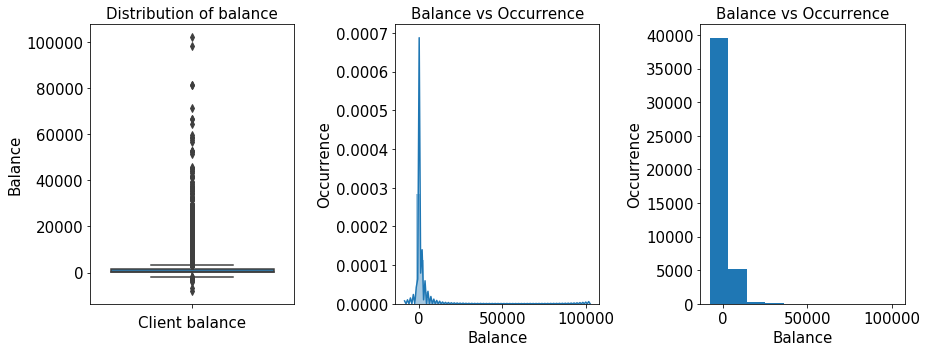

In [29]:
Q1=bank_data['balance'].quantile(q=0.25)
Q3=bank_data['balance'].quantile(q=0.75)

print('1st Quartile (Q1) is: ', Q1)
print('3st Quartile (Q3) is: ', Q3)
print()
print()

# IQR=Q3-Q1
#lower 1.5*IQR whisker i.e Q1-1.5*IQR
#upper 1.5*IQR whisker i.e Q3+1.5*IQR

L_outliers=Q1-1.5*(Q3-Q1)
U_outliers=Q3+1.5*(Q3-Q1)


print('Lower outliers in Balance: ', L_outliers)
print('Upper outliers in Balance: ', U_outliers)
print()
print()
print('Number of outliers in Balance upper : ', bank_data[bank_data['balance']>643]['balance'].count())
print('Number of outliers in Balance lower : ', bank_data[bank_data['balance']<-221]['balance'].count())
print()
print()
print('% of Outlier in Balance upper: ',round(bank_data[bank_data['balance']>643]['balance'].count()*100/len(bank_data)), '%')
print('% of Outlier in Balancee lower: ',round(bank_data[bank_data['balance']<-221]['balance'].count()*100/len(bank_data)), '%')
print()
print()


fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='balance',data=bank_data,orient='v',ax=ax1)
ax1.set_xlabel('Client balance', fontsize=15)
ax1.set_ylabel('Balance', fontsize=15)
ax1.set_title('Distribution of balance', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(bank_data['balance'],ax=ax2)
ax2.set_xlabel('Balance', fontsize=15)
ax2.set_ylabel('Occurrence', fontsize=15)
ax2.set_title('Balance vs Occurrence', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(bank_data['balance'])
ax3.set_xlabel('Balance', fontsize=15)
ax3.set_ylabel('Occurrence', fontsize=15)
ax3.set_title('Balance vs Occurrence', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

##### Mean and median are different.
##### Balance is right skewed. As more number of data points are present on right tail. The boxplot, distplot and histogram is also showing the same.
##### Balance attribute does not have any missing values.

### Related to previous contact:

#### contact,  month, day, duration

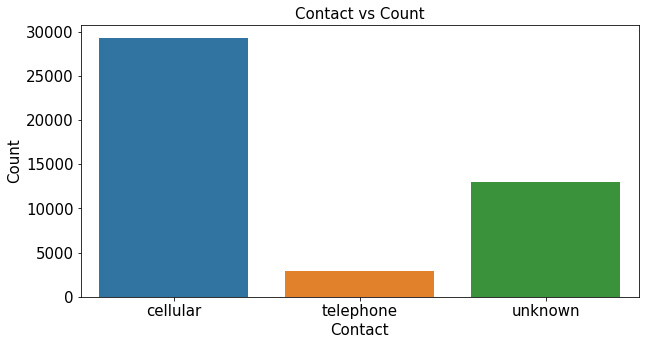

In [30]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(bank_data['contact'],data=bank_data)
ax.set_xlabel('Contact', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Contact vs Count', fontsize=15)
ax.tick_params(labelsize=15)

In [31]:
print('Day: \n', bank_data['loan'].unique())
print()
print()
print('Month: \n', bank_data['loan'].unique())

Day: 
 [no, yes]
Categories (2, object): [no, yes]


Month: 
 [no, yes]
Categories (2, object): [no, yes]


In [32]:
print('Count values in Day: \n',bank_data.groupby('loan').size())
print()
print()
print('Count values in Month: \n', bank_data.groupby('loan').size())

Count values in Day: 
 loan
no     37967
yes     7244
dtype: int64


Count values in Month: 
 loan
no     37967
yes     7244
dtype: int64


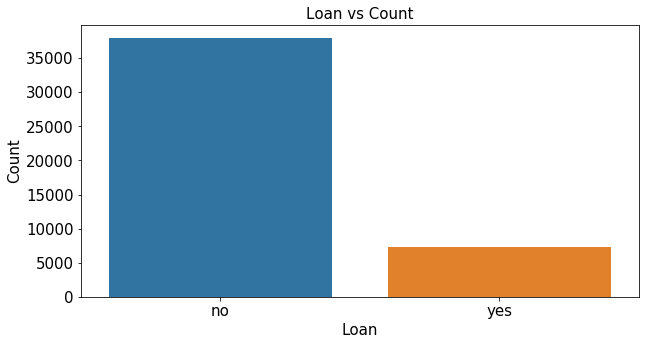

In [33]:
fig, ax=plt.subplots()
fig.set_size_inches(10,5)

#countplot
sns.countplot(bank_data['loan'],data=bank_data)
ax.set_xlabel('Loan', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_title('Loan vs Count', fontsize=15)
ax.tick_params(labelsize=15)

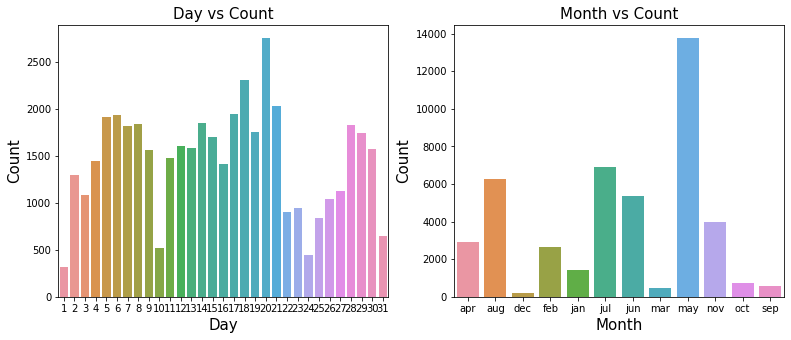

In [34]:
fig, (ax1,ax2)=plt.subplots(1,2,figsize=(13,5))

#countplot
sns.countplot(bank_data['day'],data=bank_data,ax=ax1)
ax1.set_xlabel('Day', fontsize=15)
ax1.set_ylabel('Count', fontsize=15)
ax1.set_title('Day vs Count', fontsize=15)
ax1.tick_params(labelsize=10)

#distplot
sns.countplot(bank_data['month'],data=bank_data,ax=ax2)
ax2.set_xlabel('Month', fontsize=15)
ax2.set_ylabel('Count', fontsize=15)
ax2.set_title('Month vs Count', fontsize=15)
ax2.tick_params(labelsize=10)

In [35]:
print('Minimum duration calls in seconds: ', bank_data['duration'].min())
print('Maximum duration calls in seconds: ',bank_data['duration'].max())
print('Mean duration calls in seconds: ', bank_data['duration'].mean())
print('Median duration calls in seconds: ',bank_data['duration'].median())
print('Standard deviation: ', bank_data['duration'].std())
print('Null values: ',bank_data['duration'].isnull().any())

Minimum duration calls in seconds:  0
Maximum duration calls in seconds:  4918
Mean duration calls in seconds:  258.1630797814691
Median duration calls in seconds:  180.0
Standard deviation:  257.52781226517095
Null values:  False


In [36]:
print('Number of outliers in Duration upper : ', bank_data[bank_data['duration']>643]['duration'].count())
print('Number of outliers in Balance lower : ', bank_data[bank_data['duration']<-221]['duration'].count())
print('% of Outlier in Duration upper: ',round(bank_data[bank_data['duration']>643]['duration'].count()*100/len(bank_data)), '%')
print('% of Outlier in Duration lower: ',round(bank_data[bank_data['duration']<-221]['duration'].count()*100/len(bank_data)), '%')

Number of outliers in Duration upper :  3235
Number of outliers in Balance lower :  0
% of Outlier in Duration upper:  7.0 %
% of Outlier in Duration lower:  0.0 %


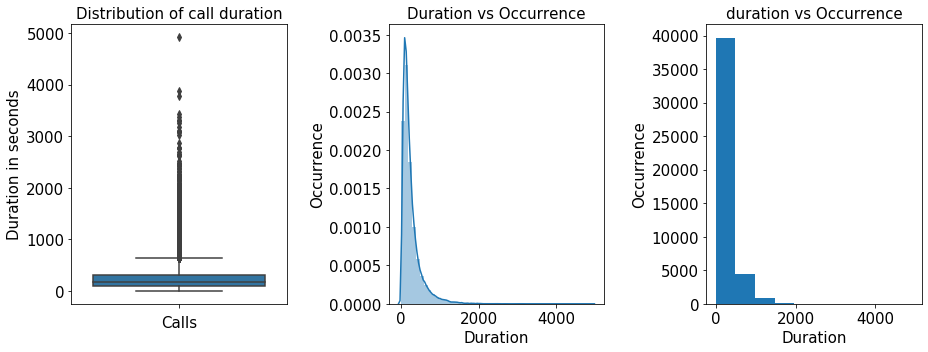

In [37]:
fig, (ax1,ax2,ax3)=plt.subplots(1,3,figsize=(13,5))

#boxplot
sns.boxplot(x='duration',data=bank_data,orient='v',ax=ax1)
ax1.set_xlabel('Calls', fontsize=15)
ax1.set_ylabel('Duration in seconds', fontsize=15)
ax1.set_title('Distribution of call duration', fontsize=15)
ax1.tick_params(labelsize=15)

#distplot
sns.distplot(bank_data['duration'],ax=ax2)
ax2.set_xlabel('Duration', fontsize=15)
ax2.set_ylabel('Occurrence', fontsize=15)
ax2.set_title('Duration vs Occurrence', fontsize=15)
ax2.tick_params(labelsize=15)

#histogram
ax3.hist(bank_data['duration'])
ax3.set_xlabel('Duration', fontsize=15)
ax3.set_ylabel('Occurrence', fontsize=15)
ax3.set_title('duration vs Occurrence', fontsize=15)
ax3.tick_params(labelsize=15)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

### Multivariate analysis

### Using correlation method to observe the relationship between different variables and state the insights

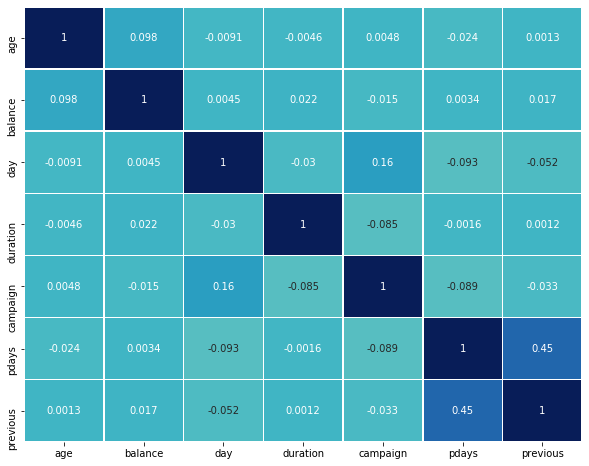

In [38]:
plt.figure(figsize=(10,8))

sns.heatmap(bank_data.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=False,
            cmap="YlGnBu")

plt.show()

In [39]:
#Encoding of categorical variables
#importing the Encoding library
from sklearn.preprocessing import LabelEncoder

labelencoder_X=LabelEncoder()
bank_data['job']=labelencoder_X.fit_transform(bank_data['job'])
bank_data['marital']=labelencoder_X.fit_transform(bank_data['marital'])
bank_data['education']=labelencoder_X.fit_transform(bank_data['education'])
bank_data['default']=labelencoder_X.fit_transform(bank_data['default'])
bank_data['housing']=labelencoder_X.fit_transform(bank_data['housing'])
bank_data['loan']=labelencoder_X.fit_transform(bank_data['loan'])
bank_data['contact']= labelencoder_X.fit_transform(bank_data['contact']) 
bank_data['month']= labelencoder_X.fit_transform(bank_data['month']) 
bank_data['poutcome'] = labelencoder_X.fit_transform(bank_data['poutcome'])
bank_data['Target'] = labelencoder_X.fit_transform(bank_data['Target'])

In [40]:
bank_data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,2,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0
1,44,6,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0
2,33,1,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0
3,47,9,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0
4,33,8,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0


In [41]:
bank_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
job,45211.0,4.473779,3.205847,0.0,2.0,4.0,7.0,9.0
marital,45211.0,1.167725,0.608230,0.0,1.0,1.0,2.0,2.0
education,45211.0,1.224813,0.747997,0.0,1.0,1.0,2.0,3.0
default,45211.0,0.018027,0.133049,0.0,0.0,0.0,0.0,1.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
housing,45211.0,0.555838,0.496878,0.0,0.0,1.0,1.0,1.0
loan,45211.0,0.160226,0.366820,0.0,0.0,0.0,0.0,1.0
contact,45211.0,0.640242,0.897951,0.0,0.0,0.0,2.0,2.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0


<Figure size 1440x720 with 0 Axes>

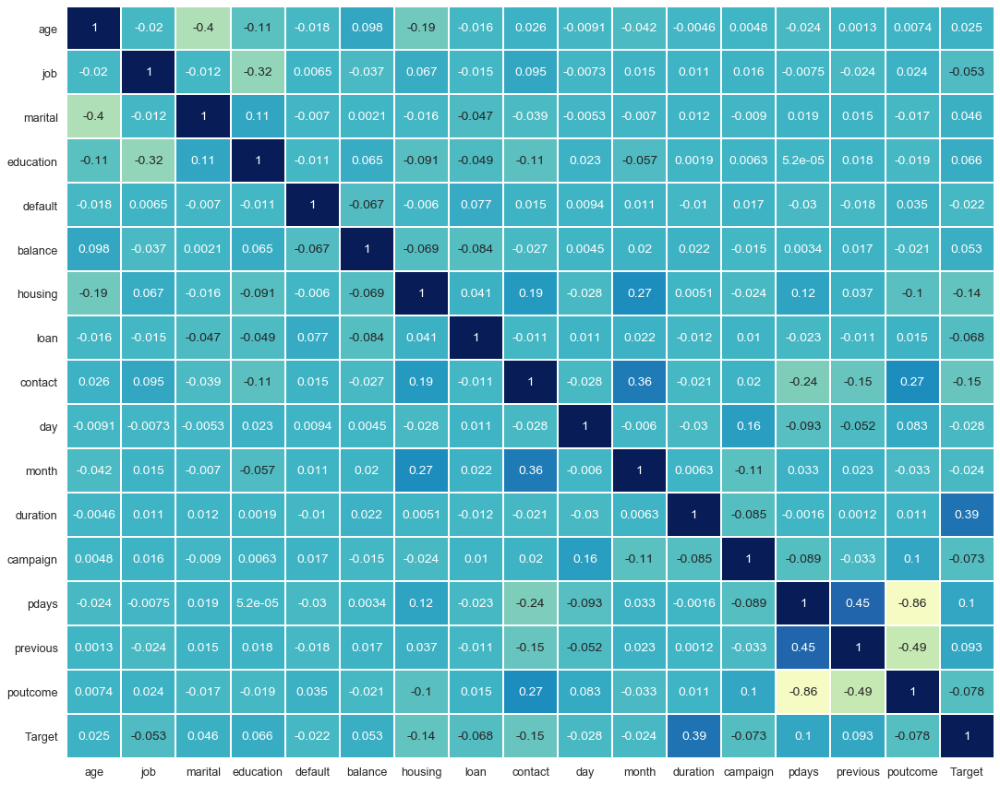

In [42]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1.15)
fig,ax=plt.subplots(figsize=(18,15))
sns.heatmap(bank_data.corr(),
            annot=True,
            linewidths=1,
            center=0,
            cbar=False,
            cmap="YlGnBu")

plt.show()

In [43]:
bank_data['Target'].value_counts()

0    39922
1     5289
Name: Target, dtype: int64

RuntimeError: Selected KDE bandwidth is 0. Cannot estiamte density.

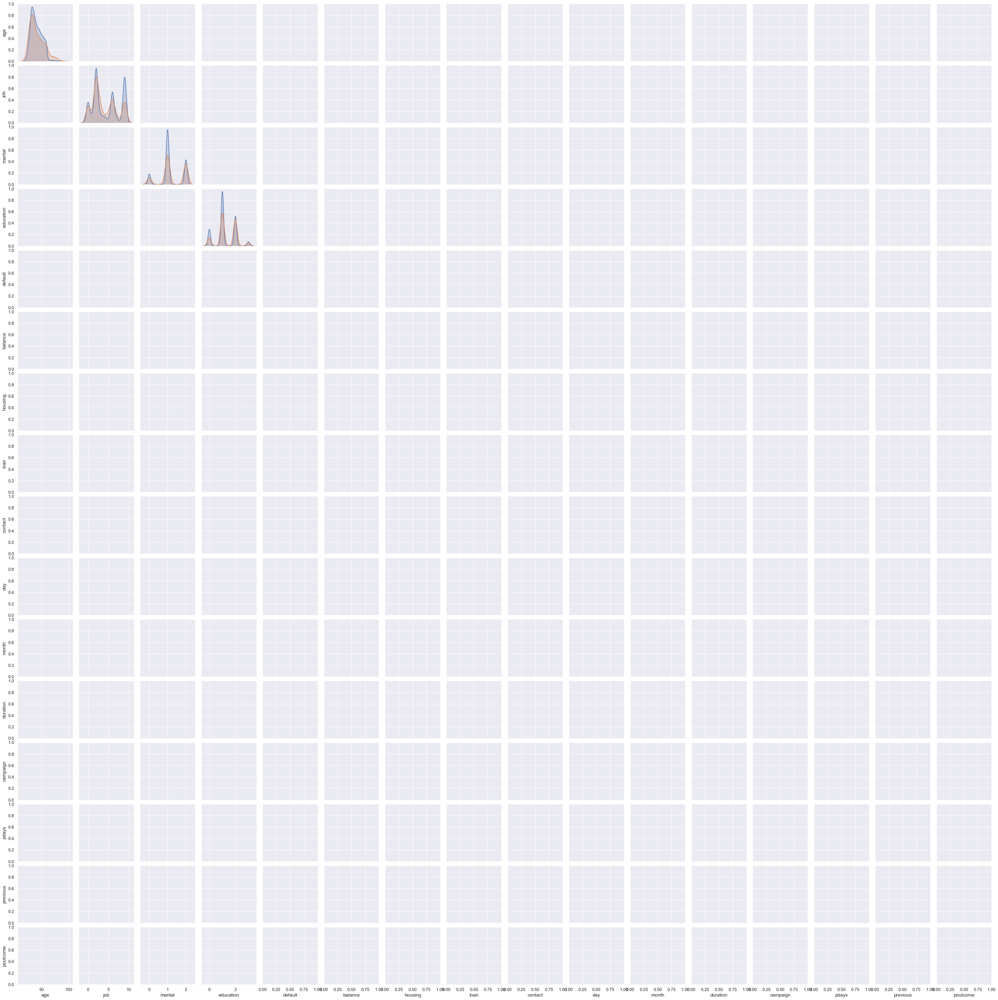

In [44]:
sns.pairplot(bank_data, hue = 'Target')

##### We can find relationship with - (Conitinous) Age, balance vs (Categorical attribute) Target

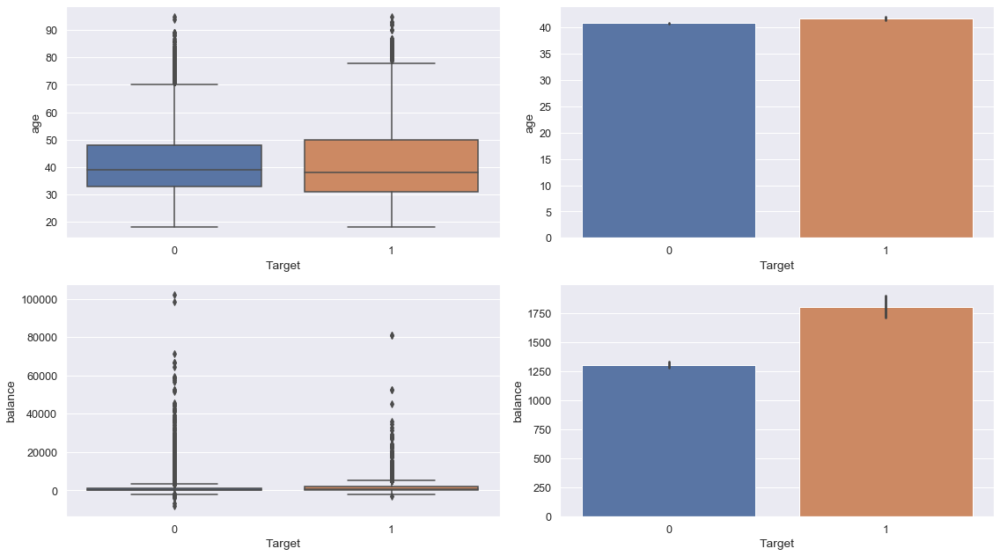

In [45]:
fig, ax=plt.subplots(2,2,figsize=(16,9))
# Target vs Age
#boxplot
sns.boxplot(x="Target", y="age", data=bank_data,ax=ax[0][0])

#barplot
sns.barplot(x="Target", y="age", data=bank_data,ax=ax[0][1])


# Target vs balance
#boxplot
sns.boxplot(x="Target", y="balance", data=bank_data,ax=ax[1][0])


#barplot
sns.barplot(x="Target", y="balance", data=bank_data,ax=ax[1][1])

plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

##### We can also find relationship with - (Categorical) MArital vs (Categorical attribute) Target

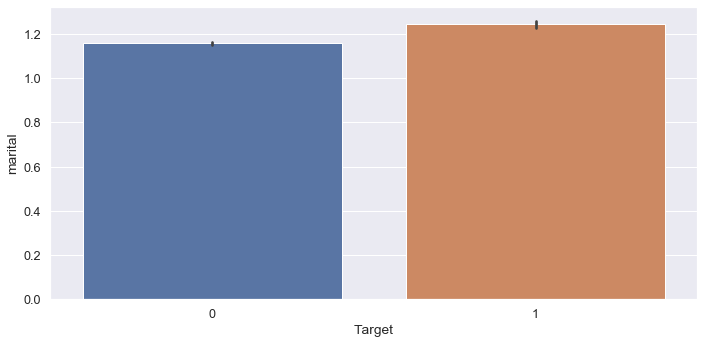

In [46]:
# Target vs marital
fig, ax1=plt.subplots(1,1,figsize=(10,5))

#barplot
sns.barplot(x="Target", y="marital", data=bank_data,ax=ax1)

plt.subplots_adjust(wspace=0.5)
plt.tight_layout() 

ax2.tick_params(labelsize=15)


plt.subplots_adjust(wspace=0.5)
plt.tight_layout()

##### Split the Bank_data into training and test set in the ratio of 70:30 (Training:Test) based on dependent and independent variables

In [47]:
# splitting data into training and test set for independent attributes
from sklearn.model_selection import train_test_split

features = [col for col in bank_data.columns if col != 'Target']

X_train, X_test, y_train, y_test = train_test_split(bank_data[features], bank_data['Target'], test_size=.3, random_state=22)
X_train.shape, X_test.shape

((31647, 16), (13564, 16))

### Create the decision tree model using “entropy” method of finding the split columns and fit it to training data

In [48]:
from sklearn.tree import DecisionTreeClassifier
model_entropy=DecisionTreeClassifier(criterion='entropy')

In [49]:
model_entropy.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

##### Print the accuracy of the model & print the confusion matrix

In [50]:
print("Train: %.2f" % model_entropy.score(X_train, y_train))  # performance on train data
print("Test: %.2f" % model_entropy.score(X_test, y_test))  # performance on test data

Train: 1.00
Test: 0.88


In [53]:
# invoking the decision tree classifier function. Using 'entropy' method of finding the split columns. Other option                             
dt_model = DecisionTreeClassifier(criterion = 'entropy',random_state=100 )
#Fitting the model
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [56]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz
bank_df=bank_data
xvar = bank_df.drop('Target', axis=1)
feature_cols = xvar.columns

In [57]:
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bank_data1.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.306056 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.306056 to fit



In [58]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

                Imp
age        0.087839
job        0.034978
marital    0.019817
education  0.023642
default    0.000899
balance    0.105938
housing    0.031268
loan       0.009358
contact    0.054347
day        0.080903
month      0.108373
duration   0.308632
campaign   0.028628
pdays      0.057743
previous   0.016865
poutcome   0.030771


#### It shows the importance of the columns.We can infer that duration, month, balance that impact more the Target column.

In [59]:
#Making the prediction
y_predict = dt_model.predict(X_test)

In [60]:
#Import the metrics
from sklearn import metrics

In [61]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_DT=metrics.accuracy_score(y_test, y_predict)
print('Accuracy DT: ',acc_DT)
print('Confusion Matrix DT: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report DT: \n',metrics.classification_report(y_test, y_predict))

Accuracy DT:  0.8770274255381894
Confusion Matrix DT: 
 [[11121   852]
 [  816   775]]
Classification report DT: 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93     11973
           1       0.48      0.49      0.48      1591

    accuracy                           0.88     13564
   macro avg       0.70      0.71      0.71     13564
weighted avg       0.88      0.88      0.88     13564



In [62]:
dt_model = DecisionTreeClassifier(criterion = 'entropy',random_state=100 )
#Fitting the model
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [64]:
#Store the accuracy results for each model in a dataframe for final comparison
results = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT})
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.877027


##### So using Decision Tree Model, we got accuracy of 11854/13564 = 87% and 13% as misclassification error.
###### There is a overfitting in the model as the dataset is performing 100% accurately in trainnig data. However, the accuracy of the testing data drops

### There is a high degree of overfitting in the model due to which the test accuracy drops drastically. This shows why decision trees are prone to overfitting.
#### Regularize/prune the decision tree by limiting the max. depth of trees and print the accuracy.

In [65]:
clf_pruned = DecisionTreeClassifier(criterion = "entropy", max_depth=7)
clf_pruned.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=7, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [66]:
print("Train: %.2f" % clf_pruned.score(X_train, y_train))  # performance on train data
print("Test: %.2f" % clf_pruned.score(X_test, y_test))  # performance on test data

Train: 0.91
Test: 0.90


## Visualizing the tree

In [67]:
y_train.value_counts()

0    27949
1     3698
Name: Target, dtype: int64

In [68]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz

xvar = bank_data.drop('Target', axis=1)
feature_cols = xvar.columns

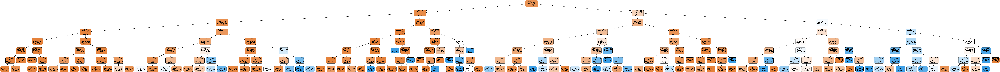

In [69]:
dot_data = StringIO()
export_graphviz(clf_pruned, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = features,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('bank_data.png')
Image(graph.create_png())

In [70]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix

from yellowbrick.classifier import ClassificationReport, ROCAUC

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [71]:
preds_train = clf_pruned.predict(X_train)
preds_test = clf_pruned.predict(X_test)

acc_DT = accuracy_score(y_test, preds_test)

## Decision tree performance

In [72]:
# Confusion matrix
pd.crosstab(y_test, preds_test, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,11521,452
1,883,708


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


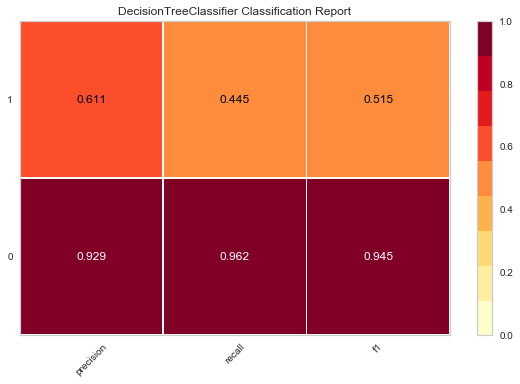

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


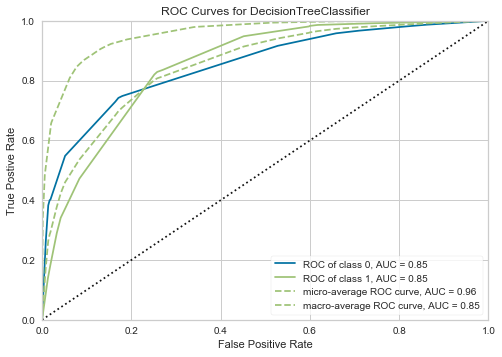

In [73]:
# Visualize model performance with yellowbrick library
viz = ClassificationReport(DecisionTreeClassifier(criterion = "entropy", max_depth=7))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

roc = ROCAUC(DecisionTreeClassifier(criterion = "entropy", max_depth=4))
roc.fit(X_train, y_train)
roc.score(X_test, y_test)
roc.show()

In [74]:
# Import Logistic Regression machine learning library
from sklearn.linear_model import LogisticRegression 

#Import Naive Bayes' machine learning Library
from sklearn.naive_bayes import GaussianNB

#Import Sklearn package's data splitting function which is based on random function
from sklearn.model_selection import train_test_split

#Import the metrics
from sklearn import metrics

In [75]:
bank_data['ProbQuality_0'] = clf_pruned.predict_proba(bank_data[features])[:,0]
bank_data['ProbQuality_1'] = clf_pruned.predict_proba(bank_data[features])[:,1]
bank_data.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,ProbQuality_0,ProbQuality_1
0,58,2,1,2,0,2143,1,0,2,5,8,261,1,-1,0,3,0,0.999409,0.000591
1,44,6,2,1,0,29,1,0,2,5,8,151,1,-1,0,3,0,0.999409,0.000591
2,33,1,1,1,0,2,1,1,2,5,8,76,1,-1,0,3,0,0.999409,0.000591
3,47,9,1,3,0,1506,1,0,2,5,8,92,1,-1,0,3,0,0.999409,0.000591
4,33,8,2,3,0,1,0,0,2,5,8,198,1,-1,0,3,0,0.999409,0.000591
5,35,2,1,2,0,231,1,0,2,5,8,139,1,-1,0,3,0,0.999409,0.000591
6,28,2,2,2,0,447,1,1,2,5,8,217,1,-1,0,3,0,0.999409,0.000591
7,42,1,0,2,1,2,1,0,2,5,8,380,1,-1,0,3,0,0.988473,0.011527
8,58,3,1,0,0,121,1,0,2,5,8,50,1,-1,0,3,0,0.999409,0.000591
9,43,6,2,1,0,593,1,0,2,5,8,55,1,-1,0,3,0,0.999409,0.000591


## When the tree is regularised, overfitting is reduced, and there is no increase in accuracy

In [76]:
## Calculating feature importance

feat_importance = clf_pruned.tree_.compute_feature_importances(normalize=False)


feat_imp_dict = dict(zip(features, clf_pruned.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
duration,0.507778
contact,0.127605
month,0.118000
pdays,0.066932
housing,0.063170
poutcome,0.062155
previous,0.013488
day,0.013270
age,0.011658
balance,0.010139


### It shows the importance of the columns. We can infer that duration, contact, month and pdays are the variables that impact more the Target column.

In [77]:
reg_dt_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = 7,random_state=100,min_samples_leaf=5)
reg_dt_model.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=7, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=100, splitter='best')

In [78]:
y_predict = reg_dt_model.predict(X_test)

In [79]:
#Evaluate the model using accuracy, confusion metrix, and classification report
acc_pruned_DT=metrics.accuracy_score(y_test, y_predict)
print("Accuracy Pruned DT:",acc_pruned_DT)
print('Confusion Matrix Pruned DT: \n',metrics.confusion_matrix(y_test, y_predict))
print('Classification report Pruned DT: \n',metrics.classification_report(y_test, y_predict))

Accuracy Pruned DT: 0.9013565319964613
Confusion Matrix Pruned DT: 
 [[11515   458]
 [  880   711]]
Classification report Pruned DT: 
               precision    recall  f1-score   support

           0       0.93      0.96      0.95     11973
           1       0.61      0.45      0.52      1591

    accuracy                           0.90     13564
   macro avg       0.77      0.70      0.73     13564
weighted avg       0.89      0.90      0.89     13564



In [80]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Pruned Decision Tree'], 'accuracy': [acc_pruned_DT]},index={'2'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.877027
2,Pruned Decision Tree,0.901357


## Apply the Random forest model and print the accuracy of Random forest Model

In [81]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(X_train, y_train)

In [82]:
pred_RF = rfcl.predict(X_test)
acc_RF = accuracy_score(y_test, pred_RF)

In [83]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]},index={'3'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.877027
2,Pruned Decision Tree,0.901357
3,Random Forest,0.904158


In [84]:
y_predict = rfcl.predict(X_test)
acc_RF=metrics.accuracy_score(y_test , y_predict)
print('Accuracy using Random forest: ',acc_RF)
print('Confusion Matrix Random Forest: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using Random forest:  0.9041580654674137
Confusion Matrix Random Forest: 
 [[11605   368]
 [  932   659]]


## Apply Bagging Classifier Algorithm and print the accuracy.

In [85]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=22)
bgcl = bgcl.fit(X_train, y_train)

In [86]:
pred_BG = bgcl.predict(X_test)
acc_BG = accuracy_score(y_test, pred_BG)

In [87]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_BG]},index={'4'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.877027
2,Pruned Decision Tree,0.901357
3,Random Forest,0.904158
4,Bagging,0.903716


In [88]:
y_predict = bgcl.predict(X_test)
acc_bg=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using Bagging: ',acc_bg)
print('Confusion Matrix using Bagging: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using Bagging:  0.9037157180772634
Confusion Matrix using Bagging: 
 [[11530   443]
 [  863   728]]


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


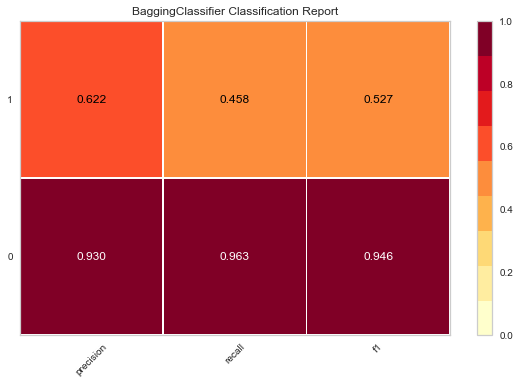

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


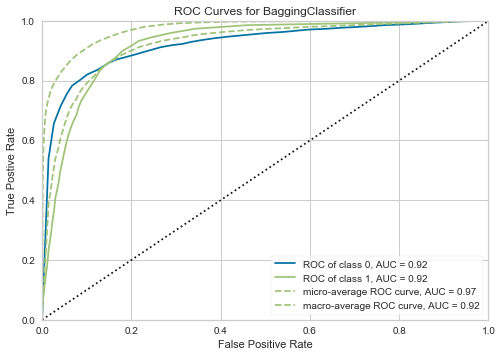

In [89]:
# Visualize model performance with yellowbrick library
viz = ClassificationReport(BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=22))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

roc = ROCAUC(BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=22))
roc.fit(X_train, y_train)
roc.score(X_test, y_test)
roc.show()

## Apply Adaboost Ensemble Algorithm for the same data and print the accuracy.

In [90]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators = 100, learning_rate=0.1, random_state=22)
abcl = abcl.fit(X_train, y_train)

In [91]:
pred_AB =abcl.predict(X_test)
acc_AB = accuracy_score(y_test, pred_AB)

In [92]:
tempResultsDf = pd.DataFrame({'Method':['AdaBoosting'], 'accuracy': [acc_AB]},index={'5'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.877027
2,Pruned Decision Tree,0.901357
3,Random Forest,0.904158
4,Bagging,0.903716
5,AdaBoosting,0.887791


In [93]:
y_predict = abcl.predict(X_test)
acc_AB=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using AdaBoosting: ',acc_AB)
print('Confusion Matrix: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using AdaBoosting:  0.887791212031849
Confusion Matrix: 
 [[11775   198]
 [ 1324   267]]


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


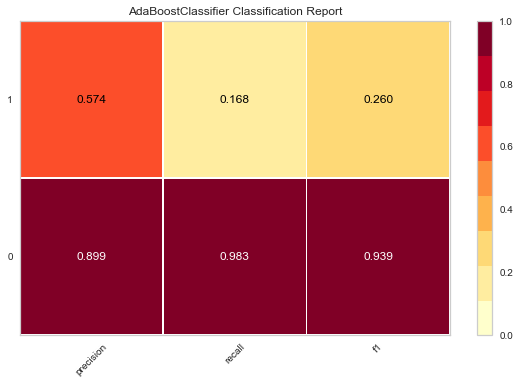

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


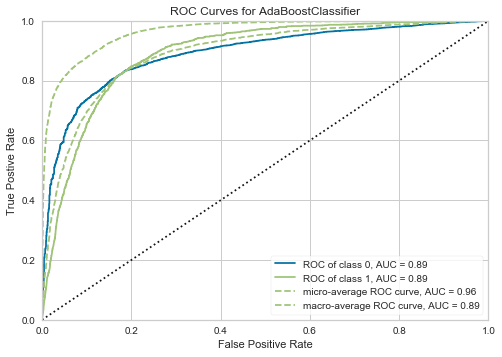

In [94]:
# Visualize model performance with yellowbrick library
viz = ClassificationReport(AdaBoostClassifier(n_estimators= 100, learning_rate=0.1, random_state=22))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

roc = ROCAUC(AdaBoostClassifier(n_estimators= 100, learning_rate=0.1, random_state=22))
roc.fit(X_train, y_train)
roc.score(X_test, y_test)
roc.show()

## Apply GradientBoost Classifier Algorithm for the same data and print the accuracy

In [95]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22)
gbcl = gbcl.fit(X_train, y_train)

In [96]:
pred_GB = gbcl.predict(X_test)
acc_GB = accuracy_score(y_test, pred_GB)

In [97]:
tempResultsDf = pd.DataFrame({'Method':['GradientBoosting'], 'accuracy': [acc_GB]},index={'6'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.877027
2,Pruned Decision Tree,0.901357
3,Random Forest,0.904158
4,Bagging,0.903716
5,AdaBoosting,0.887791
6,GradientBoosting,0.899440


In [98]:
y_predict = gbcl.predict(X_test)
acc_GB=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using GradientBoosting: ',acc_GB)
print('Confusion Matrix using GradientBoosting: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using GradientBoosting:  0.8994396933058095
Confusion Matrix using GradientBoosting: 
 [[11678   295]
 [ 1069   522]]


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


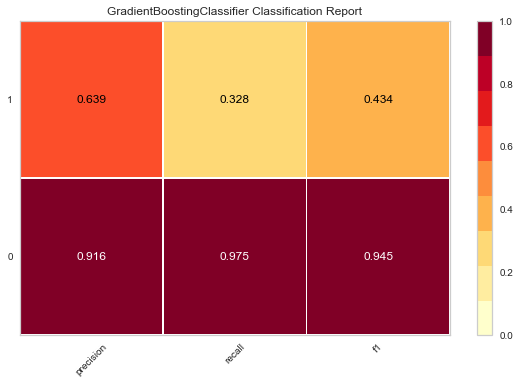

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:197: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


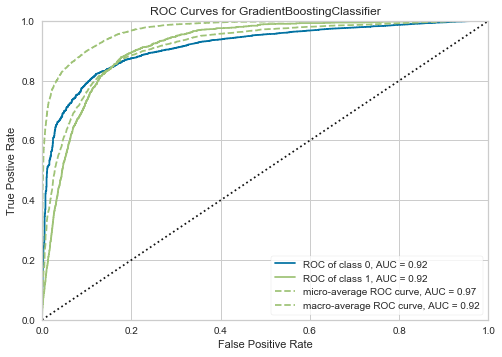

In [99]:
# Visualize model performance with yellowbrick library
viz = ClassificationReport(GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

roc = ROCAUC(GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22))
roc.fit(X_train, y_train)
roc.score(X_test, y_test)
roc.show()

## Ensemble Logistic Regression, Naive Bayes, Decision Tree

In [100]:
#Multiple model Ensemble
from sklearn import svm
LR=LogisticRegression()
NB=GaussianNB()
#DT=DecisionTreeClassifier()  ('DT',DT),
SVM=svm.SVC()

In [101]:
# Import Logistic Regression machine learning library
from sklearn.linear_model import LogisticRegression 

#Import Naive Bayes' machine learning Library
from sklearn.naive_bayes import GaussianNB

#Import Sklearn package's data splitting function which is based on random function
from sklearn.model_selection import train_test_split

#Import the metrics
from sklearn import metrics

#Import the Voting classifier for Ensemble
from sklearn.ensemble import VotingClassifier

In [102]:
evc=VotingClassifier(estimators=[('LR',LR),('NB',NB),('SVM',SVM)],voting='hard')

In [103]:
evc.fit(X_train,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


VotingClassifier(estimators=[('LR',
                              LogisticRegression(C=1.0, class_weight=None,
                                                 dual=False, fit_intercept=True,
                                                 intercept_scaling=1,
                                                 l1_ratio=None, max_iter=100,
                                                 multi_class='auto',
                                                 n_jobs=None, penalty='l2',
                                                 random_state=None,
                                                 solver='lbfgs', tol=0.0001,
                                                 verbose=0, warm_start=False)),
                             ('NB',
                              GaussianNB(priors=None, var_smoothing=1e-09)),
                             ('SVM',
                              SVC(C=1.0, break_ties=False, cache_size=200,
                                  class_weight=None, coef0=0.0,
 

In [104]:
y_predict = evc.predict(X_test)
#evc.score(X_test,y_test)

In [105]:
acc_Ensemble=metrics.accuracy_score(y_test, y_predict)
print('Accuracy using Ensemble: ',acc_Ensemble)
print('Confusion Matrix: \n',metrics.confusion_matrix(y_test, y_predict))

Accuracy using Ensemble:  0.8863167207313477
Confusion Matrix: 
 [[11759   214]
 [ 1328   263]]


In [106]:
tempResultsDf = pd.DataFrame({'Method':['Ensemble'], 'accuracy': [acc_Ensemble]},index={'7'})
results = pd.concat([results, tempResultsDf])
results = results[['Method', 'accuracy']]
results

,Method,accuracy
0,Decision Tree,0.877027
2,Pruned Decision Tree,0.901357
3,Random Forest,0.904158
4,Bagging,0.903716
5,AdaBoosting,0.887791
6,GradientBoosting,0.899440
7,Ensemble,0.886317


# Results:

### Decision Tree and Pruned Decesion Tree, Random Forest, Bagging, GradientBoosting giving the highest accuracy. 

### Random Forest, Bagging models give the best results on test predictions.

### But these models are biased because there are 39922 customers who do not have subscribed term deposit. Only few 5289 customers have subscribed term deposit. So, these models are biased.